# An Introduction to Working with EPA CEMS data

CEMS or <a href='https://www.epa.gov/emc/emc-continuous-emission-monitoring-systems'>**Continusous Emissions Monitoring Systems**</a> are used to track power plant's compliance with EPA emission standards. Among the data are hourly measurements of SO2, CO2, and NOx emissions associated with a given plant. The EPA's <a href='https://www.epa.gov/airmarkets'>Clean Air Markets Division</a> has collected CEMS data stretching back to 1990 and publicized it in their <a href='https://ampd.epa.gov/ampd/'>data portal</a>. Combinging the CEMS data with EIA and FERC data provides access to greater and more specific information about utilities and generation facilities. This notebook provides a glimpse into the analysis potential of CEMS data usage and integration.

**NOTE**: This Notebook presuposes access to the parquet files in which the CEMS data is stored.

## Setup

The following packages enable interaction with the CEMS dataset through pudl.

In [4]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [12]:
# Standard libraries
import logging
import os
import pathlib
import sys

# 3rd party libraries
import geopandas as gpd
import dask.dataframe as dd
from dask.distributed import Client
import numpy as np
import pandas as pd
import sqlalchemy as sa
import pyarrow

# Local libraries
import pudl

In [13]:
logger=logging.getLogger()
logger.setLevel(logging.INFO)
handler = logging.StreamHandler(stream=sys.stdout)
formatter = logging.Formatter('%(message)s')
handler.setFormatter(formatter)
logger.handlers = [handler]

In [14]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
sns.set()
%matplotlib inline

In [15]:
pudl_settings = pudl.workspace.setup.get_defaults()
#display(pudl_settings)

ferc1_engine = sa.create_engine(pudl_settings['ferc1_db'])
#display(ferc1_engine)

pudl_engine = sa.create_engine(pudl_settings['pudl_db'])
#display(pudl_engine)

#pudl_engine.table_names()
pudl_out = pudl.output.pudltabl.PudlTabl(pudl_engine, freq='AS') #annual frequency

## Reading in EPA CEMS data

### Step-by-step walk-through

The CEMS dataset is enormous! It contains hourly operations and emissions data for thousands of power plants between 1995 and 2019.
The full dataset is close to a billion rows and takes up 100 GB of space uncompressed, which means it will not all fit in memory
on your laptop at the same time. [Dask](https://dask.org) is a pandas-like library that provides lots of functionality for dealing
with larger than memory datasets. [This post by Tom Augsperger](https://tomaugspurger.github.io/modern-8-scaling.html) is a nice compact
introduction to working with larger datasets in Pandas / Dask.

One of the main features of Dask is "lazy execution" -- it doesn't read data or do any computation until it has to, or you explicitly tell it to. Instead,
it allows you to build of a series of computational instructions, and then it intelligently looks at those instructions and executes them so as to minimize
memory utilization and/or parallelize the tasks if possible.

For example, you can "read" in the full EPA CEMS dataset almost instantly... but that's because no data has been read off of disk yet. The instructions
for reading off of the disk have been added to the list of things the Dask dataframe will do when you actually as it for a result.

In [16]:
epacems_path = pathlib.Path(pudl_settings["parquet_dir"]) / "epacems"
epacems_dd = dd.read_parquet(epacems_path)

However, some information about the dataframe is available at this point -- including the names of the columns and their data types -- because that
information is stored in the Parquet file metadata:

In [17]:
epacems_dd.dtypes

plant_id_eia                               int32
unitid                                    object
operating_datetime_utc       datetime64[ns, UTC]
operating_time_hours                     float32
gross_load_mw                            float32
steam_load_1000_lbs                      float32
so2_mass_lbs                             float32
so2_mass_measurement_code               category
nox_rate_lbs_mmbtu                       float32
nox_rate_measurement_code               category
nox_mass_lbs                             float32
nox_mass_measurement_code               category
co2_mass_tons                            float32
co2_mass_measurement_code               category
heat_content_mmbtu                       float32
facility_id                              float64
unit_id_epa                              float64
year                                    category
state                                   category
dtype: object

If you want to know anything about the contents of the data itself, some data will have to be read in, and some computation performed.
Before any aggregations or calculations or selections have happened, you can ask how many rows there are in the whole parquet dataset,
and it will be returned relatively quickly, since that information is also stored in the metadata. This would behave differently later
on, since after you've told the dataframe to do some computation, you'd be asking for the length of the **result of that computation**
not the original inputs.

In [18]:
%%time
len(epacems_dd)

CPU times: user 23.1 s, sys: 6.96 s, total: 30 s
Wall time: 18.5 s


791223000

#### Select a subset of EPA CEMS rows
<a id='1subset'></a>

You can point Dask at a large parquet dataset like EPA CEMS and tell it to read in only a subset of the columns, and the select a subset of the rows
based on some criteria of interest. So long as the collection of rows and columns you've specified end up being smaller than the available memory on
you computer, this operation will succeed. However, depending on how fast your disk is, it may still take longer than you would like.


The following statement will tell Dask where the dataset is, and describe a subset of the data that should be returned as a pandas dataframe (only data about
power plants in Colorado, in the year 2018 -- which should be small enough to fit in memory), but it won't actually read the data in yet:

In [19]:
slow_epacems_dd = (
    dd.read_parquet(epacems_path)
    .query("year==2018")
    .query("state=='CO'")
)

If we're satisfied that this is the data we want, then we can go ahead and ask Dask to read it in and give us a pandas dataframe back.
This will alloweus to search through more than 50 GB of data on disk and select only the small subset that we are interested in without
blowing up our memory usage. However, it will still take a long time -- maybe 5 minutes on a laptop with a fast SSD (uncomment it if you
want to actually give this a try...):

In [ ]:
#%%time
#slow_epacems_df = slow_epacems_dd.compute()

#### Filter using Parquet partitions

To make operations like this faster and easier, we have pre-partitioned the EPA CEMS Parquet dataset by `state` and `year` -- there's a separate parquet file
that contains each state's data for each year, in a directory structure that many tools for working with Parquet files understand. This means you can tell Dask
that there are only certain files it needs to look in for the data you're interested in. Rather than scanning through 50 GB of data across 1300 different files,
it can just read data from the single file that contains the 2018 data for Colorado. On a computer with a fast SSD, this should takes about a fraction of a second:

In [20]:
%%time
epacems_dd = dd.read_parquet(
    epacems_path,
    filters=[[("state", "=", "CO"), ("year", "=", 2018)]],
)
epacems_df = epacems_dd.compute()
epacems_df.sample(10)

/Users/aesharpe/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/dask/dataframe/io/parquet/arrow.py:680: UserWarning: Filtering with gather_statistics=False. Only partition columns will be filtered correctly.
  warnings.warn(


CPU times: user 319 ms, sys: 168 ms, total: 487 ms
Wall time: 552 ms


,plant_id_eia,unitid,operating_datetime_utc,operating_time_hours,gross_load_mw,steam_load_1000_lbs,so2_mass_lbs,so2_mass_measurement_code,nox_rate_lbs_mmbtu,nox_rate_measurement_code,nox_mass_lbs,nox_mass_measurement_code,co2_mass_tons,co2_mass_measurement_code,heat_content_mmbtu,facility_id,unit_id_epa,year,state
431333,6761,101,2018-09-30 12:00:00+00:00,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,875,2906,2018,CO
275950,6761,B,2018-06-28 05:00:00+00:00,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,875,8362,2018,CO
264616,492,7,2018-06-05 23:00:00+00:00,1.0,113.0,NaN,23.600,Measured,0.221,Measured,268.404999,Calculated,127.400002,Measured,1214.500000,83,315,2018,CO
519351,469,5,2018-11-26 22:00:00+00:00,1.0,230.0,NaN,0.900,Measured,0.011,Measured,16.768000,Calculated,90.599998,Measured,1524.400024,79,90850,2018,CO
224134,6761,C,2018-05-14 05:00:00+00:00,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,875,8364,2018,CO
410491,56998,CT04,2018-08-07 02:00:00+00:00,1.0,31.0,NaN,0.199,Measured,0.004,Measured,1.329000,Calculated,19.700001,Measured,332.200012,8289,90499,2018,CO
188884,55453,2,2018-04-11 11:00:00+00:00,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,1493,4791,2018,CO
358710,56998,CT05,2018-07-19 13:00:00+00:00,1.0,27.0,NaN,0.181,Measured,0.003,Measured,0.906000,Calculated,17.900000,Measured,301.899994,8289,90557,2018,CO
344445,55453,1,2018-07-14 04:00:00+00:00,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,1493,4790,2018,CO
517548,56998,CT08,2018-10-12 19:00:00+00:00,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,8289,90863,2018,CO


#### A Partition Filter Shortcut
Unfortunately, the nested list of lists of boolean predicates used to specify the filters (known as
[disjunctive normal form](https://en.wikipedia.org/wiki/Disjunctive_normal_form) is a little unwieldy, so we have some
helper functions that can construct them for you. `pudl.output.epacems.year_state_filter()` will give you a filter that
selects the data for all combinations of the years and states you specify:

In [21]:
demo_filter = pudl.output.epacems.year_state_filter(years=[2018, 2019], states=["CO", "CA"])
demo_filter

[[('year', '=', 2018), ('state', '=', 'CO')],
 [('year', '=', 2018), ('state', '=', 'CA')],
 [('year', '=', 2019), ('state', '=', 'CO')],
 [('year', '=', 2019), ('state', '=', 'CA')]]

In [22]:
%%time
epacems_dd = dd.read_parquet(
    epacems_path,
    filters=demo_filter
)
epacems_df = epacems_dd.compute()
epacems_df.sample(10)

/Users/aesharpe/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/dask/dataframe/io/parquet/arrow.py:680: UserWarning: Filtering with gather_statistics=False. Only partition columns will be filtered correctly.
  warnings.warn(


CPU times: user 2.79 s, sys: 1.47 s, total: 4.26 s
Wall time: 4.59 s


,plant_id_eia,unitid,operating_datetime_utc,operating_time_hours,gross_load_mw,steam_load_1000_lbs,so2_mass_lbs,so2_mass_measurement_code,nox_rate_lbs_mmbtu,nox_rate_measurement_code,nox_mass_lbs,nox_mass_measurement_code,co2_mass_tons,co2_mass_measurement_code,heat_content_mmbtu,facility_id,unit_id_epa,year,state
448459,55538,CTG1,2018-03-19 03:00:00+00:00,0.37,17.0,NaN,0.050,Measured,0.008,Measured,0.662,Calculated,4.921000,Measured,82.695000,1543,90893,2018,CA
1937052,56232,1,2018-11-10 20:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,8081,89534,2018,CA
416032,10649,GT1,2019-03-26 00:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,8440,91243,2019,CA
1620394,260,3A,2018-10-22 18:00:00+00:00,1.00,258.0,NaN,1.086,Measured,0.007,Measured,12.669,Calculated,97.366997,Other,1809.800049,47,150,2018,CA
1323097,55217,X725,2019-08-21 09:00:00+00:00,1.00,287.0,NaN,1.174,Measured,0.007,Measured,13.691,Calculated,116.199997,Measured,1955.900024,1344,4154,2019,CA
1226951,57482,7,2019-07-14 07:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,8328,90720,2019,CA
1890527,55333,3,2018-11-22 07:00:00+00:00,1.00,222.0,NaN,0.947,Measured,0.007,Measured,11.045,Calculated,93.800003,Measured,1577.800049,1186,3741,2018,CA
651569,55951,AMP-1,2018-04-30 01:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,8046,89370,2018,CA
739285,389,3-1,2018-05-14 21:00:00+00:00,1.00,42.0,NaN,0.195,Measured,0.005,Measured,1.629,Calculated,19.400000,Measured,325.700012,70,90785,2018,CA
1465293,404,7,2019-09-24 05:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,73,90960,2019,CA


#### Limiting columns

Often you will only be interested in a certain subset of the columns stored in a parquet dataset.
Parquet files are organized internally to make it very efficient to only select certain columns, and the `read_parquet()` method makes this easy.
Say you're only interested in power outputs, fuel consumed, and CO2 emissions, but not traditional air pollutants:

In [23]:
%%time
ghg_cols = [
    "state",
    "year",
    "operating_datetime_utc",
    "plant_id_eia",
    "facility_id",
    "unit_id_epa",
    "unitid",
    "operating_time_hours",
    "gross_load_mw",
    "heat_content_mmbtu",
    "co2_mass_tons",
]
epacems_dd = dd.read_parquet(
    epacems_path,
    filters=demo_filter,
    columns=ghg_cols,
)
epacems_df = epacems_dd.compute()
epacems_df.sample(10)

/Users/aesharpe/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/dask/dataframe/io/parquet/arrow.py:680: UserWarning: Filtering with gather_statistics=False. Only partition columns will be filtered correctly.
  warnings.warn(


CPU times: user 2.1 s, sys: 1.09 s, total: 3.18 s
Wall time: 3.9 s


,state,year,operating_datetime_utc,plant_id_eia,facility_id,unit_id_epa,unitid,operating_time_hours,gross_load_mw,heat_content_mmbtu,co2_mass_tons
1492972,CA,2018,2018-09-25 12:00:00+00:00,6013,784,2678,02,0.0,0.0,0.000000,NaN
1339845,CA,2019,2019-08-06 05:00:00+00:00,55541,7228,8640,1,0.0,0.0,0.000000,NaN
450236,CA,2018,2018-03-31 04:00:00+00:00,55540,1544,4974,1B,0.0,0.0,0.000000,NaN
1104993,CA,2019,2019-07-16 17:00:00+00:00,408,74,89304,6,0.0,0.0,0.000000,NaN
1367624,CA,2018,2018-08-30 16:00:00+00:00,55698,7233,8954,HEP1,0.0,0.0,0.000000,NaN
154556,CA,2019,2019-01-24 04:00:00+00:00,56914,8272,90426,CTG1,0.0,0.0,0.000000,NaN
35085,CO,2019,2019-01-06 04:00:00+00:00,55283,1397,4423,2,1.0,200.0,1460.599976,86.800003
1612038,CA,2018,2018-09-06 14:00:00+00:00,57515,8319,90679,GT3,0.0,0.0,0.000000,NaN
1757849,CA,2018,2018-10-15 01:00:00+00:00,56232,8081,90490,2,0.0,0.0,0.000000,NaN
606949,CO,2018,2018-12-26 20:00:00+00:00,55453,1493,4792,3,0.0,0.0,0.000000,NaN


### Combining these tools
By filtering to include only particular year / state partitions, limiting columns, and querying the resulting data based on its contents, you can efficiently select only the data of interest.

For example, say you want to look at the operational history of Xcel Energy Colorado's Comanche coal plant in Pueblo Colorado, across all the years of operation, and you want to analyze the columns we enumerated above. Since you know you only need data from Colorado, you can create a filter that will only
read from the CO partitions. You can also look up the `plant_id_eia` value for Comanche and select only the records that match.

In [24]:
comanche_colorado = (
    pudl_out.plants_eia860()
    .query("plant_name_eia=='Comanche'")
    .query("state=='CO'")
    .loc[:,["report_date", "plant_id_eia", "plant_name_eia", "utility_id_eia", "city"]]
    .merge(pudl_out.utils_eia860()[["utility_id_eia", "utility_name_eia", "report_date"]])
)
comanche_colorado

,plant_id_eia,plant_name_eia,city,utility_id_eia,utility_name_eia,report_date


#### A shortcut for reading plant data
If you have a collection of `plant_id_eia` values and you don't know what states they're located in, or what years they were operating in, you can
also look that information up in the `plants_eia860` table, and use it to create a years / states filter. However, note that the range of years covered
by EIA 860 is less than those covered by EPA CEMS at the moment, so this information won't be comprehensive (especially in the case of years of operation):

In [25]:
plant_ids = [
    470, # Comanche, in Pueblo, Colorado
    3,   # The Barry plant in Alabama
]
plant_states = list(
    pudl_out.plants_eia860()
    .query("plant_id_eia in @plant_ids")
    .state.unique()
)
plant_filter = pudl.output.epacems.year_state_filter(states=plant_states)
plant_filter

[[('state', '=', 'AL')], [('state', '=', 'CO')]]

## Example #1: Observing One Plant at High Data Granularity
Let's read in data just for the Comanche coal plant in Pueblo, CO, and calculate some additional values:
* Gross Generation (MWh)
* Heat Rate (mmBTU / MWh)
* Gross CO2 intensity (tons / MWh)

In [26]:
%%time
only_colorado = pudl.output.epacems.year_state_filter(states=["CO"])
comanche_dd = (
    dd.read_parquet(
        epacems_path,
        filters=only_colorado,
        columns=ghg_cols,
    )
    .query("plant_id_eia==470")
)
comanche_df = (
    comanche_dd.compute()
    .assign(
        gross_generation_mwh=lambda x: x.operating_time_hours * x.gross_load_mw,
        heat_rate_mmbtu_mwh=lambda x: x.heat_content_mmbtu / x.gross_generation_mwh,
        gross_co2_intensity=lambda x: x.co2_mass_tons / x.gross_generation_mwh
    )
)
comanche_df.sample(10)

/Users/aesharpe/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/dask/dataframe/io/parquet/arrow.py:680: UserWarning: Filtering with gather_statistics=False. Only partition columns will be filtered correctly.
  warnings.warn(


CPU times: user 3.08 s, sys: 1.42 s, total: 4.5 s
Wall time: 3.16 s


,state,year,operating_datetime_utc,plant_id_eia,facility_id,unit_id_epa,unitid,operating_time_hours,gross_load_mw,heat_content_mmbtu,co2_mass_tons,gross_generation_mwh,heat_rate_mmbtu_mwh,gross_co2_intensity
85993,CO,2004,2004-03-07 08:00:00+00:00,470,NaN,NaN,1,0.0,0.0,0.000000,NaN,0.0,NaN,NaN
524498,CO,2010,2010-11-01 09:00:00+00:00,470,80.0,89734.0,3,1.0,607.0,5333.299805,559.400024,607.0,8.786325,0.921582
215844,CO,2016,2016-05-06 19:00:00+00:00,470,80.0,89734.0,3,1.0,749.0,6798.000000,713.000000,749.0,9.076101,0.951936
409441,CO,2006,2006-10-24 08:00:00+00:00,470,NaN,NaN,2,1.0,329.0,3551.600098,364.399994,329.0,10.795137,1.107599
470871,CO,2010,2010-10-20 22:00:00+00:00,470,80.0,299.0,1,1.0,317.0,2814.300049,295.200012,317.0,8.877918,0.931230
382021,CO,2012,2012-08-01 20:00:00+00:00,470,80.0,300.0,2,1.0,360.0,3643.399902,382.100006,360.0,10.120555,1.061389
160825,CO,2017,2017-04-12 08:00:00+00:00,470,80.0,300.0,2,1.0,223.0,2263.399902,237.399994,223.0,10.149776,1.064574
179136,CO,1999,1999-09-24 07:00:00+00:00,470,NaN,NaN,1,1.0,317.0,2932.100098,300.799988,317.0,9.249527,0.948896
161773,CO,2016,2016-04-08 20:00:00+00:00,470,80.0,299.0,1,0.0,0.0,0.000000,NaN,0.0,NaN,NaN
372320,CO,2015,2015-08-02 15:00:00+00:00,470,80.0,89734.0,3,1.0,795.0,7195.600098,754.700012,795.0,9.051069,0.949308


This has selected 500k rows and 50 MB of data out of ~1 billion rows and ~100 GB in a few seconds:

In [27]:
comanche_df.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 490848 entries, 6696 to 573599
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype              
---  ------                  --------------   -----              
 0   state                   490848 non-null  category           
 1   year                    490848 non-null  category           
 2   operating_datetime_utc  490848 non-null  datetime64[ns, UTC]
 3   plant_id_eia            490848 non-null  int32              
 4   facility_id             329040 non-null  float64            
 5   unit_id_epa             329040 non-null  float64            
 6   unitid                  490848 non-null  object             
 7   operating_time_hours    490564 non-null  float32            
 8   gross_load_mw           490848 non-null  float32            
 9   heat_content_mmbtu      490848 non-null  float32            
 10  co2_mass_tons           426750 non-null  float32            
 11  gross_generation_mwh   

### Visualizing Comanche Operations Over Time
Now that we've got a managable dataframe, we can visualize what's inside it! Here's the heat content of the fuel consumed each hour for the last 25 years in the three Comanche coal units.

#### Fuel Consumption

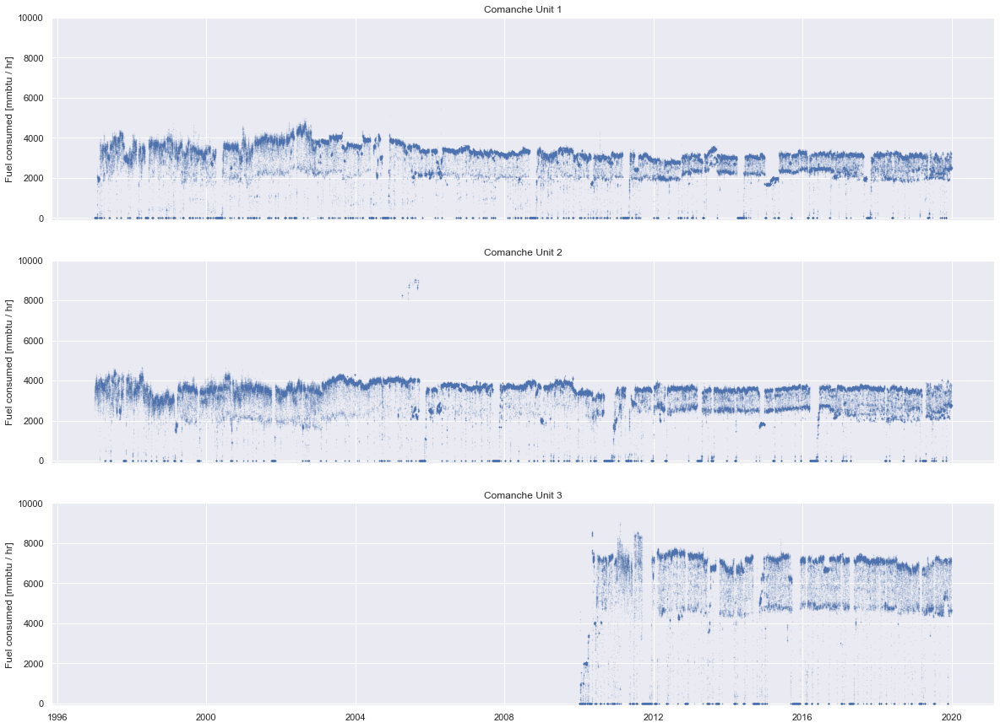

In [28]:
unit_ids = comanche_df.unitid.unique()
fig, axs = plt.subplots(nrows=len(unit_ids), ncols=1, sharex=True, figsize=(20,15))
for n, unitid in enumerate(comanche_df.unitid.unique()):
    axs[n].scatter(
        comanche_df.query("unitid==@unitid").operating_datetime_utc,
        comanche_df.query("unitid==@unitid").heat_content_mmbtu,
        s=0.2, alpha=0.1,
    )
    axs[n].set_ylim(-100,10_000)
    axs[n].set_title(f"Comanche Unit {unitid}")
    axs[n].set_ylabel("Fuel consumed [mmbtu / hr]")
plt.show();

#### Heat Rate

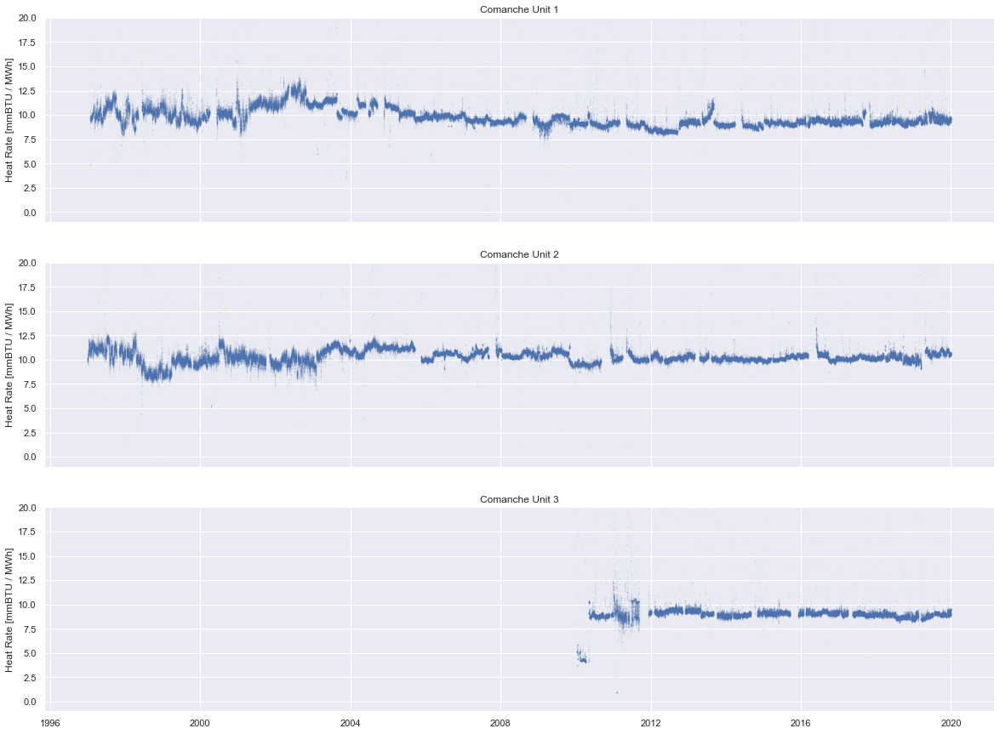

In [29]:
unit_ids = comanche_df.unitid.unique()
fig, axs = plt.subplots(nrows=len(unit_ids), ncols=1, sharex=True, figsize=(20,15))
for n, unitid in enumerate(comanche_df.unitid.unique()):
    axs[n].scatter(
        comanche_df.query("unitid==@unitid").operating_datetime_utc,
        comanche_df.query("unitid==@unitid").heat_rate_mmbtu_mwh,
        s=0.2, alpha=0.1,
    )
    axs[n].set_ylim(-1,20)
    axs[n].set_title(f"Comanche Unit {unitid}")
    axs[n].set_ylabel("Heat Rate [mmBTU / MWh]")
plt.show();

#### Carbon Intensity

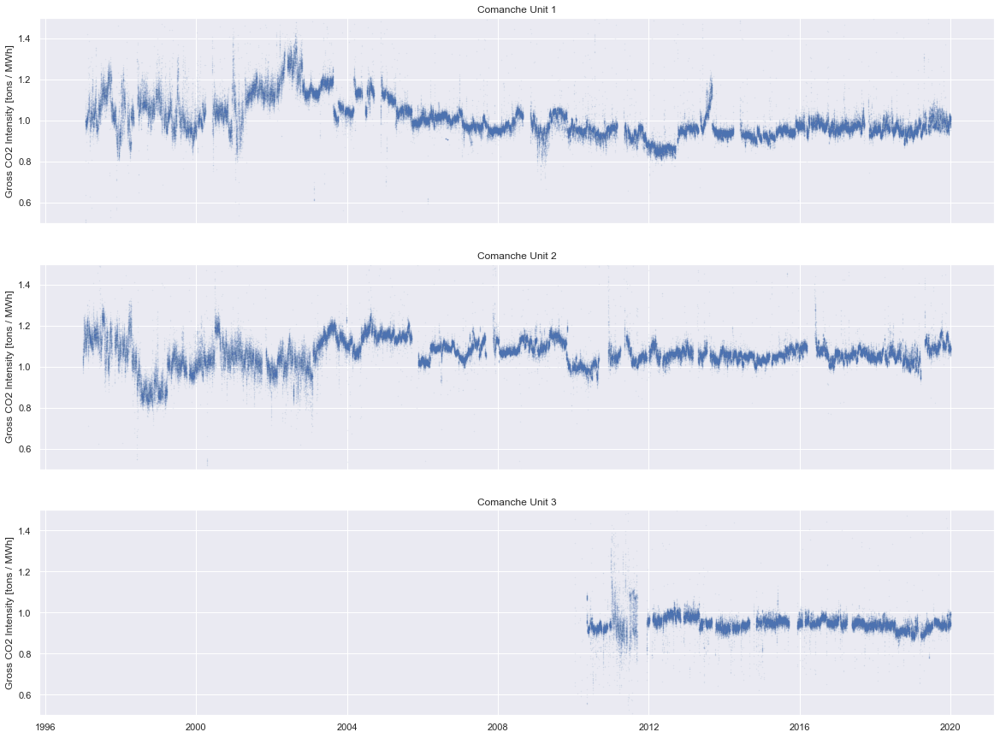

In [30]:
unit_ids = comanche_df.unitid.unique()
fig, axs = plt.subplots(nrows=len(unit_ids), ncols=1, sharex=True, figsize=(20,15))
for n, unitid in enumerate(comanche_df.unitid.unique()):
    axs[n].scatter(
        comanche_df.query("unitid==@unitid").operating_datetime_utc,
        comanche_df.query("unitid==@unitid").gross_co2_intensity,
        s=0.2, alpha=0.1,
    )
    axs[n].set_ylim(0.5,1.5)
    axs[n].set_title(f"Comanche Unit {unitid}")
    axs[n].set_ylabel("Gross CO2 Intensity [tons / MWh]")
plt.show();

#### Gross Load

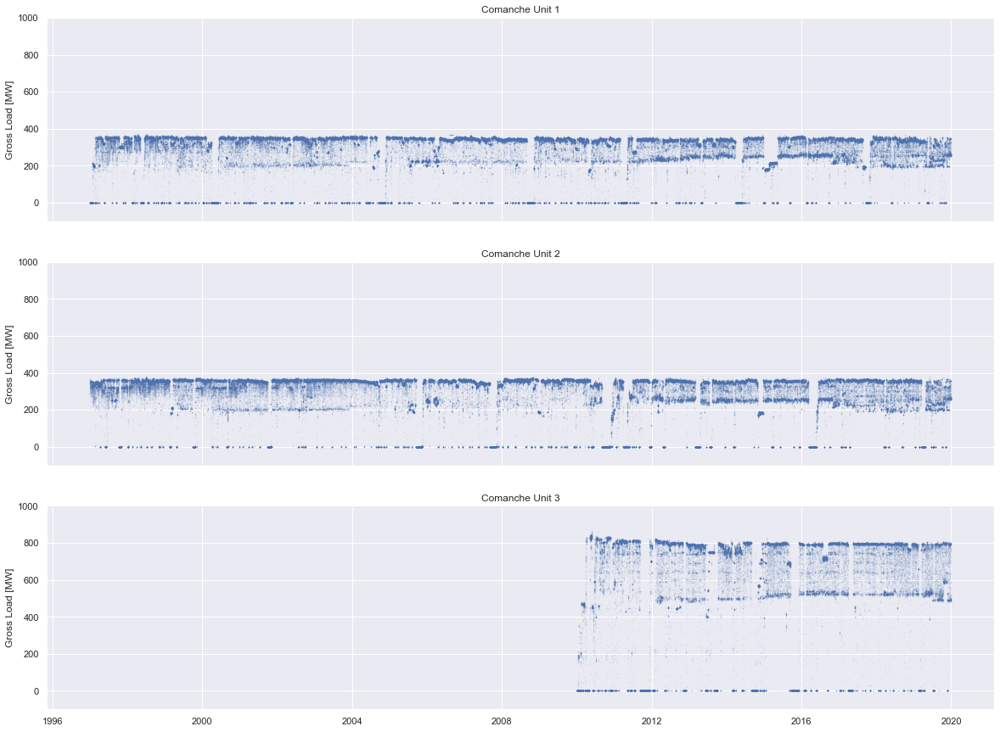

In [31]:
unit_ids = comanche_df.unitid.unique()
fig, axs = plt.subplots(nrows=len(unit_ids), ncols=1, sharex=True, figsize=(20,15))
for n, unitid in enumerate(comanche_df.unitid.unique()):
    axs[n].scatter(
        comanche_df.query("unitid==@unitid").operating_datetime_utc,
        comanche_df.query("unitid==@unitid").gross_load_mw,
        s=0.2, alpha=0.1,
    )
    axs[n].set_ylim(-100,1000)
    axs[n].set_title(f"Comanche Unit {unitid}")
    axs[n].set_ylabel("Gross Load [MW]")
plt.show();

## Example #2: Observing all Plants at Lower Data Grandularity

Instead of selecting a small subset of a large dataset to investigate at full resolution, you can aggregate records to reduce large datasets to a managable size. Now that you know what's available, you can pick the columns you'd like to work with, and aggregate rows if necessary. 

**Note** that in CEMS the `state` and `measurement_code` columns are categorical datatypes, meaning that they will overwhelm your computer's memory if included in the list of columns you'd like to groupby. In pandas, this is solved by including the statement `observed=True` in the groupby, but with Dask we'll solve this by changing the datatype to string. As mentioned previously, the dataset is very large. If the Dask dataframe you construct is too similar to the original dataset -- imagine the example below without the `groupby` -- the client will be unable to load it in pandas. The dataset below should load in a couple of minutes.

### Comparing Plant-level Emissions for Two Years

In [44]:
%%time
# Prepare CEMS data

# A list of the columns you'd like to include in your analysis
my_cols = [
    'year',
    'plant_id_eia', 
    'unitid',
    'so2_mass_lbs',
    'nox_mass_lbs',
    'co2_mass_tons'
]

# Select emissions data are grouped by state, plant_id and unit_id
# Remember to change the datatype for 'state' from category to string
my_cems_dd = (
    dd.read_parquet(epacems_path, columns=my_cols)
    .astype({
        'year': int,
    })
    .groupby(['year', 'plant_id_eia'])[[
        'so2_mass_lbs',
        'nox_mass_lbs',
        'co2_mass_tons'
    ]]
    .sum()
).reset_index()
cems_byplant = my_cems_dd.compute()

CPU times: user 3min 39s, sys: 1min 29s, total: 5min 9s
Wall time: 2min 40s


In [43]:
# Prepare EIA data for integration with CEMS
plants_df = (
    pudl_out.plants_eia860()
    .loc[:, ["plant_id_eia", "report_date", "plant_name_eia", "state", "longitude", "latitude" ]]
    .assign(year=lambda x: x.report_date.dt.year)
    .drop("report_date", axis="columns")
    .pipe(pudl.helpers.oob_to_nan, ["latitude"], lb=-90.0, ub=90.0)
    .pipe(pudl.helpers.oob_to_nan, ["longitude"], lb=-180.0, ub=180.0)
    .dropna()
    .query("state not in ('AK', 'HI')")
    .query("latitude < 50.0")
)

# Merge EIA plant data with CEMS aggregated plant data
merged_cems_df = (
    plants_df.merge(
        cems_byplant,
        on=["year", "plant_id_eia"],
        how="inner",
    )
)

# Make a geodataframe for mapping out of the merged plant data
cems_gdf = (
    gpd.GeoDataFrame(
        merged_cems_df,
        geometry=gpd.points_from_xy(merged_cems_df.longitude, merged_cems_df.latitude),
        crs="EPSG:4326",  # Geographic coordinates: Latitude / Longitude in degrees.
    )
    .drop(["latitude", "longitude"], axis="columns")
    .to_crs("EPSG:3857")
)
cems_gdf.sample(5)

,plant_id_eia,plant_name_eia,state,year,so2_mass_lbs,nox_mass_lbs,co2_mass_tons,geometry
2001,1366,Paddys Run,KY,2012,337.144989,6.312499e+04,3.140076e+04,POINT (-9555854.778 4611060.193)
12706,56068,Elm Road Generating Station,WI,2014,875212.375000,3.976784e+06,7.107948e+06,POINT (-9777591.627 5289046.644)
11910,55505,Frank Knutson,CO,2013,499.816986,2.495467e+04,4.852178e+04,POINT (-11653148.605 4857390.991)
5356,4266,Spencer,TX,2018,81.483002,8.456250e+03,8.108575e+03,POINT (-10809801.605 3921548.222)
10146,55103,Klamath Cogeneration Plant,OR,2010,12939.383789,3.334296e+05,1.281557e+06,POINT (-13559889.067 5187062.868)


In [50]:
cems_gdf[cems_gdf['year']==2009]

,plant_id_eia,plant_name_eia,state,year,so2_mass_lbs,nox_mass_lbs,co2_mass_tons,geometry
9,3,Barry,AL,2009,7.421863e+07,1.688174e+07,1.142486e+07,POINT (-9797261.781 3633645.272)
19,7,Gadsden,AL,2009,7.851693e+06,1.590670e+06,3.657224e+05,POINT (-9570225.679 4030520.883)
29,8,Gorgas,AL,2009,1.005530e+07,1.074673e+07,5.695994e+06,POINT (-9706668.420 3981145.507)
39,9,Copper,TX,2009,1.314490e+02,4.794882e+04,0.000000e+00,POINT (-11841610.833 3731442.106)
49,10,Greene County,AL,2009,6.320896e+07,8.759257e+06,2.606754e+06,POINT (-9771747.353 3842554.853)
...,...,...,...,...,...,...,...,...
13242,56603,San Jacinto County Peaking Facility,TX,2009,2.009560e+02,1.032048e+04,1.974814e+04,POINT (-10576665.195 3557561.616)
13292,56629,Waterbury Generation,CT,2009,4.948750e+02,1.174953e+04,1.998640e+04,POINT (-8130964.851 5092975.216)
13302,56639,Midway Peaking LLC,CA,2009,2.016080e+02,6.527695e+03,2.016985e+04,POINT (-13422873.810 4391003.777)
13342,56803,Panoche Energy Center,CA,2009,1.081210e+03,3.982159e+04,1.079800e+05,POINT (-13423271.554 4390627.194)


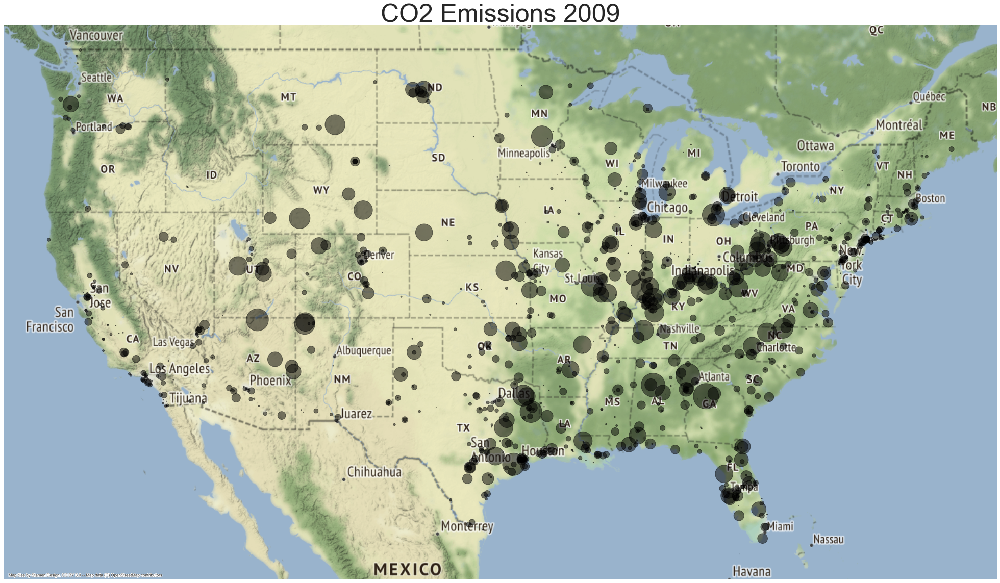

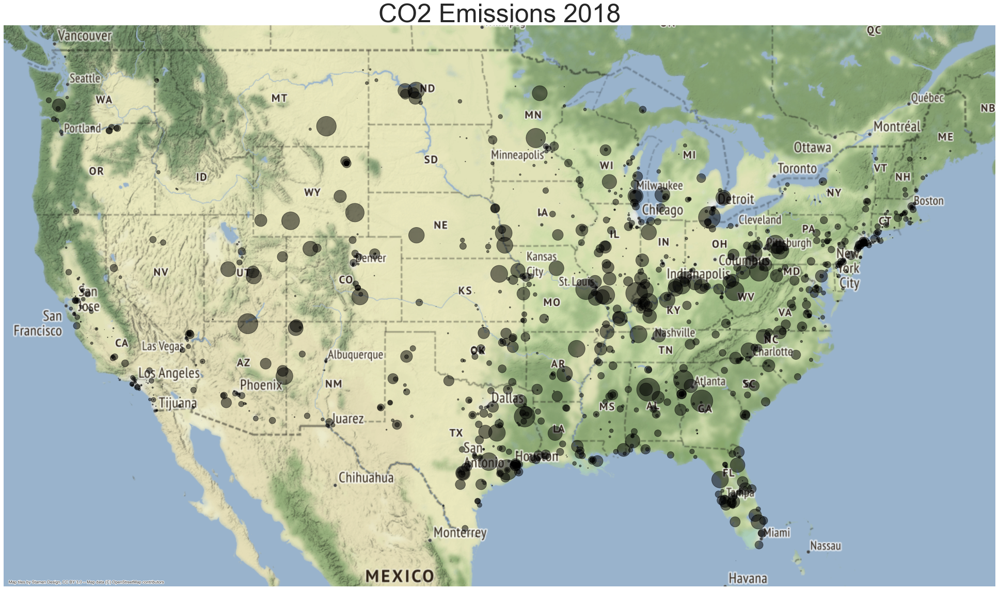

In [330]:
def map_point_source_emissions(gdf, year, states=None, scaling=1e4, alpha=0.25):
    """Map of emissions by plant coordinates in proportion to their annual amount."""
    import contextily as ctx
    gdf_to_plot = gdf.query("year==@year")
    if states is not None:
        gdf_to_plot = gdf_to_plot[gdf_to_plot.state.isin(states)]
        
    ax = gdf_to_plot.plot(
        figsize=(40,20),
        color="black",
        alpha=alpha,
        markersize=gdf_to_plot.co2_mass_tons / scaling,
    )
    ax.set_title(f'CO2 Emissions {year}', fontsize=50)
    ax.set_axis_off()
    ctx.add_basemap(ax)
    
    return ax

map_point_source_emissions(cems_gdf, 2009, states=None, scaling=1e4, alpha=0.5)
map_point_source_emissions(cems_gdf, 2018, states=None, scaling=1e4, alpha=0.5);

Now lets take a look at the difference. Of the plants that opperated both in 2009 and 2018, the red shows where there was an increase in CO2 emissions and the green shows where there was a decrease in CO2 emissions.

/Users/aesharpe/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/geopandas/geodataframe.py:853: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)
/Users/aesharpe/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/aesharpe/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


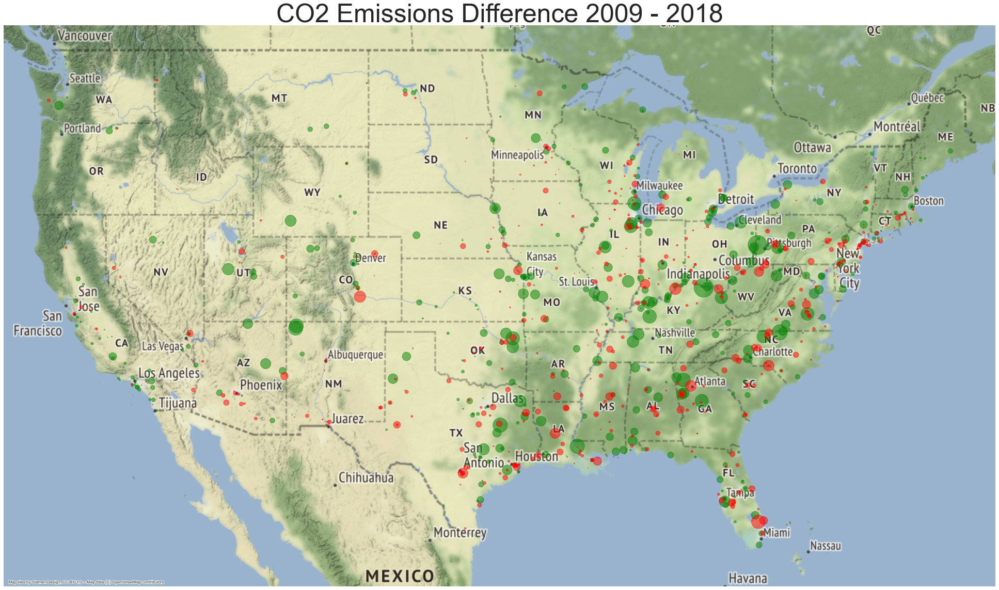

In [335]:
def calculate_emissions_difference(df):
    """Calculate the difference in emission between two years"""
    df['year_diff'] = (
        df.groupby('plant_id_eia')['co2_mass_tons']
        .diff()
    )
    df = df.dropna()

    pos_df = df[df['co2_mass_tons']>0].copy()
    neg_df = (
        df[df['year_diff']<0].copy()
        .assign(year_diff=lambda x: abs(x.year_diff))
    )
    
    return pos_df, neg_df

def map_emissions_difference(gdf, year_old, year_new, states=None, scaling=1e4, alpha=0.25):
    """Map of emissions by plant coordinates in proportion to their annual amount."""
    import contextily as ctx
    gdf_to_plot = gdf.query("year==[@year_old, @year_new]")
    if states is not None:
        gdf_to_plot = gdf_to_plot[gdf_to_plot.state.isin(states)]
        
    # Calculate emissions difference between years    
    pos_df, neg_df = calculate_emissions_difference(gdf_to_plot)
    
    # Plot figure
    fig, ax = plt.subplots(figsize=(40, 20))
    pos_df.plot(
        ax=ax,
        color="green",
        alpha=alpha,
        markersize=pos_df.year_diff / 1e4,
    )
    neg_df.plot(
        ax=ax,
        color="red",
        alpha=alpha,
        markersize=neg_df.year_diff / 1e4,
    )
    ax.set_axis_off()
    ax.set_title(f'CO2 Emissions Difference {year_old} - {year_new}', fontsize=50)
    ctx.add_basemap(ax)
    plt.show()
        
    return plt.show()

map_emissions_difference(cems_gdf, 2009, 2018, states=None, scaling=1e4, alpha=0.5)


Lets start by mapping which states have the highest CO2 emissions from power plants in 2018. States with darker colors indicate higher CO2 emissions. To do this, we'll need to merge a geodataframe of the US with the desired emissions data from each state.

##### Prep US geospatial data:

In [ ]:
# Use pre-existing pudl shapefile for state outlines
us_map_df = (
    pudl.analysis.service_territory.get_census2010_gdf(pudl_settings, 'state')
    .rename({'STUSPS10': 'state'}, axis=1)
    .to_crs("EPSG:3395")
)

##### Prep CEMS data:

In [ ]:
# Convert lbs to tons for so2 and nox and remove old columns
# Aggregate CEMS data to the state level
cems_map_df = (
    my_cems_df.assign(
        so2_mass_tons=lambda x: x.so2_mass_lbs * 0.0005,
        nox_mass_tons=lambda x: x.nox_mass_lbs * 0.0005
    ).drop(columns=['so2_mass_lbs', 'nox_mass_lbs', 'plant_id_eia'], axis=1)
    .groupby(['state', 'year']).sum(min_count=1)
    .reset_index()
)

##### Combine with Geo-data and Plot:

In [ ]:
# Combine CEMS and MAP dataframes
states_cems_gdf = pd.merge(us_map_df, cems_map_df, on='state', how='outer')

In [ ]:
states_cems_gdf[states_cems_gdf['state']=='AK']

In [ ]:
# Add plots for the US, HI, and AK

# The column on which to base the choroplath
choro_col = 'co2_mass_tons'

us_fig, us_ax = plt.subplots(figsize=(15, 10))
#ak_hi_fig, (ak_ax, hi_ax) = plt.subplots(ncols=2)

states_cems_gdf.plot(column=choro_col, cmap='Reds', linewidth=0.8, edgecolor='black', ax=us_ax)
#states_cems_gdf.plot(column=choro_col, cmap='Reds', linewidth=0.8, edgecolor='black', ax=ak_ax)
#states_cems_gdf.plot(column=choro_col, cmap='Reds', linewidth=0.8, edgecolor='black', ax=hi_ax)

us_ax.set_xlim(-1.45e7, -0.7e7) # Used to position US in center of the graph
us_ax.set_ylim(0.25e7, 0.65e7)  # Used to position US in center of the graph
us_ax.set_title('CO2 Emissions from Power Plants in 2018 (Megatons)', fontdict={'fontsize': '20'})
us_ax.axis('off')  # Remove lat and long tick marks
#ak_ax.set_xlim(1.9e7, 6.7e6)  #(-2e7, -1.4e7)
#ak_ax.set_ylim(0.6e7, 1.2e7)
#hi_ax.set_xlim(-1.71e7, -1.8e7)
#hi_ax.set_ylim(2e6, 2.6e6)

# Add a legend
vmax = states_cems_gdf[f'{choro_col}'].max() / 1000000 # (convert from tons to megatons)
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=0, vmax=vmax))
sm._A = []
cbar = us_fig.colorbar(sm, orientation="horizontal", pad=0, aspect = 50)